In [1]:
%load_ext autoreload
%reload_ext autoreload
%autoreload 2

from pathlib import Path
import sys; sys.path.insert(0, str(Path('.').resolve().parent / 'src'))
from config import CITIES, CityConfig, DATA_DIR, PLACES_PATH
from geo_utils import *
from plot_utils import *
from eval_utils import *

In [2]:
# Define city configuration
city="chicago"
cfg = CITIES[city]

In [3]:
# Load boundaries
city_gdf = load_city_boundary(cfg)
bg_gdf = load_state_block_groups(cfg)
bg_gdf = label_bgs_within_city(bg_gdf, city_gdf)

Chicago city boundary loaded: 1 row(s)
Chicago state block groups loaded: 9,896
Block groups within city: 2,164 / 9,896


/home/eprashar_solutions_corelogic_com/crime-idx-2026/src/geo_utils.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  bg['centroid'] = bg.geometry.centroid


Block groups: 9,896 total | 2,164 within city | 7,732 outside


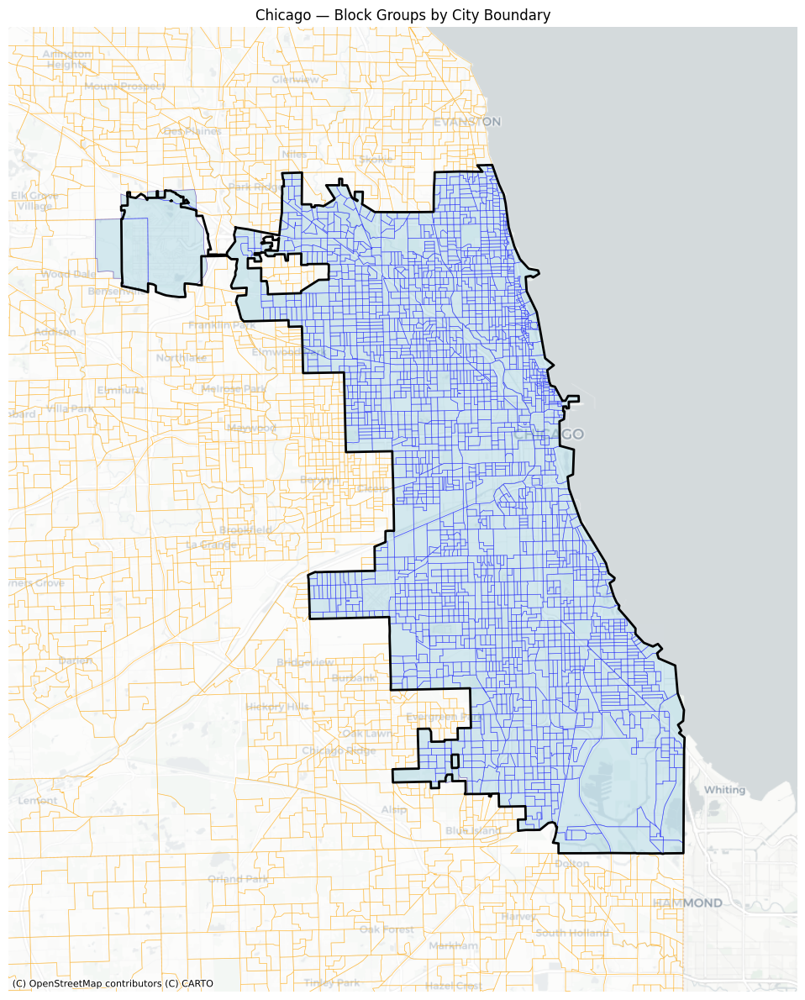

In [4]:
# Map: BGs colored by within/outside city
n_in = (bg_gdf['within_city'] == True).sum()
n_out = (bg_gdf['within_city'] == False).sum()
print(f"Block groups: {len(bg_gdf):,} total | {n_in:,} within city | {n_out:,} outside")
plot_city_with_bgs(bg_gdf, city_gdf, f"{cfg.name} — Block Groups by City Boundary")

In [5]:
# Load crime data
crime_gdf = load_crime_data(cfg)

Chicago crime data: 89,383 rows with valid coords (of 89,393)


Inside city: 89,053 | Outside: 330


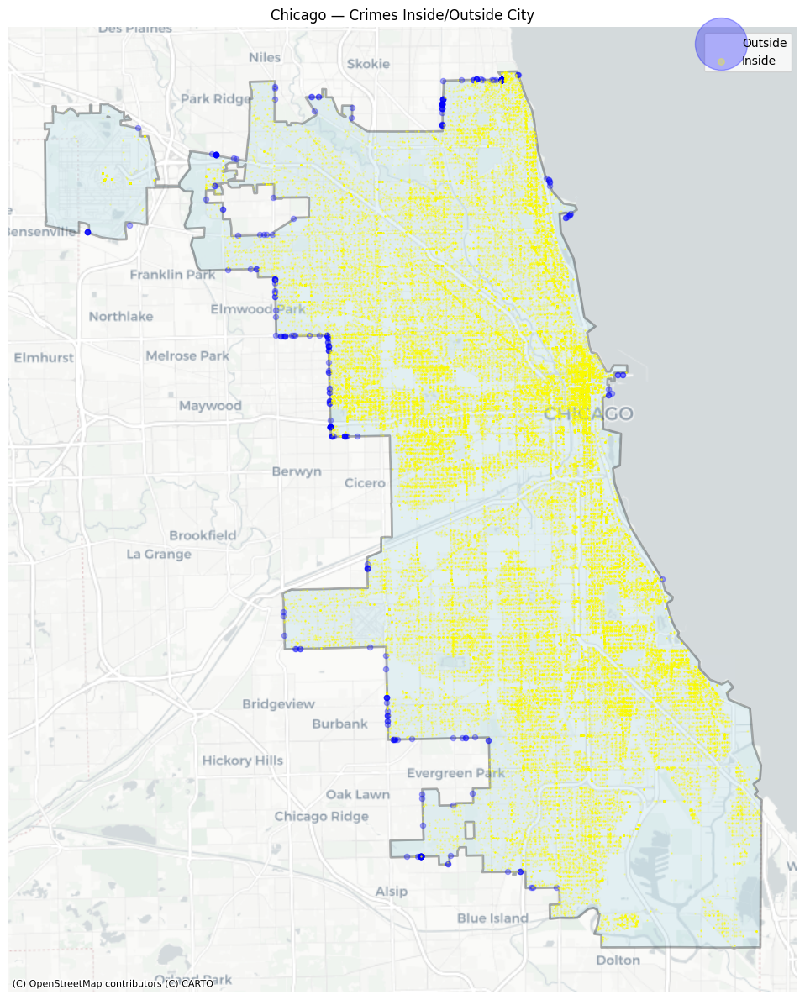

In [6]:
# Spatial join: crimes vs city boundary
inside, outside = sjoin_crimes_to_city(crime_gdf, city_gdf)
plot_crimes_vs_city(inside, outside, city_gdf, f"{cfg.name} — Crimes Inside/Outside City")

Matched to BG: 89,358 | Unmatched: 25
BGs with crimes: 2,234 (2,159 within city, 75 outside)
Crimes inside city: 88,980 | Outside: 378


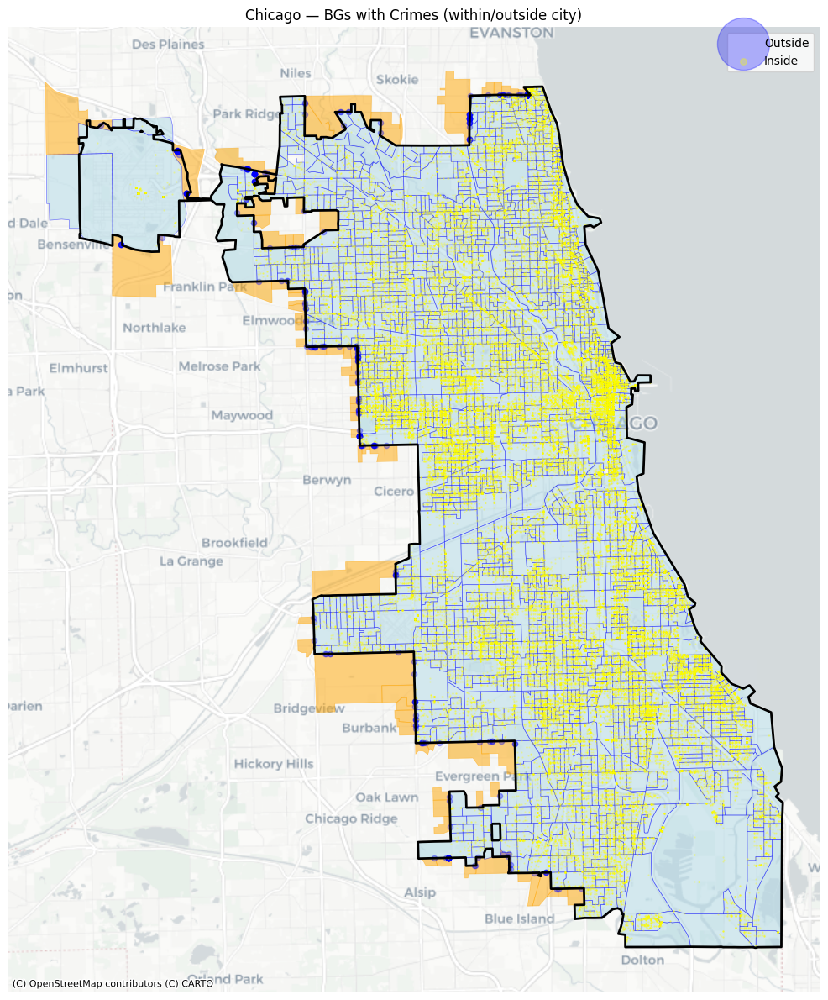

In [7]:
# Spatial join: crimes vs block groups
crime_bg = sjoin_crimes_to_bgs(crime_gdf, bg_gdf)
bg_agg = aggregate_by_bg(crime_bg)

# Crime counts inside/outside city
n_in = (crime_bg['within_city'] == True).sum()
n_out = (crime_bg['within_city'] == False).sum()
print(f"Crimes inside city: {n_in:,} | Outside: {n_out:,}")

plot_bg_crimes(bg_agg, city_gdf, f"{cfg.name} — BGs with Crimes (within/outside city)", crime_bg=crime_bg)

In [8]:
# Map crime categories
crime_bg = map_crime_categories(crime_bg, cfg)
bg_cat = aggregate_by_bg_category(crime_bg)

Mapped: 50,139 / 89,383 (56.1%)
Category counts:
crime_category
larceny     22466
vandal      10276
mvt          6898
assault      5090
burglary     2391
robbery      2034
rape          692
murder        164
fire          128

Unmapped: 39,244 records across 15 codes
BG-level category aggregation: 2,234 BGs (2,159 within city, 75 outside)
Crime Totals:
assault_count      5089.0
murder_count        163.0
rape_count          692.0
robbery_count      2033.0
burglary_count     2391.0
larceny_count     22459.0
mvt_count          6898.0
vandal_count      10275.0
violent_count      7977.0
property_count    31748.0
cl_total_count    39725.0
dtype: float64


In [9]:
# Folium interactive map
folium_bg_crimes(bg_cat, city_gdf, crime_bg, cfg,
                 output_dir=DATA_DIR.parent / 'notebooks' / 'folium_maps')

Saved /home/eprashar_solutions_corelogic_com/crime-idx-2026/notebooks/folium_maps/chicago_bg_crimes.html


In [10]:
# Merge all BGs (including those with zero crime) with category data
bg_all = merge_all_bgs_with_crimes(bg_gdf, bg_cat)

Analysis set: 2,239 BGs
  Inside city:  2,164 (2,159 with data, 5 without)
  Outside city: 75 (all with crime data)


##### Distribution of City Crimes


Cl_Total Crime Count Distribution — Inside City (2,164 BGs)
count    2164.000
mean       18.275
std        26.256
min         0.000
25%         7.000
50%        12.000
75%        21.000
max       616.000
Block groups with zero: 22 / 2,164 (1.0%)
------------------------------------------------------------
  P 1:        1   (2,142 BGs >= this)
  P 5:        2   (2,055 BGs >= this)
  P10:        4   (1,990 BGs >= this)
  P25:        7   (1,690 BGs >= this)
  P50:       12   (1,159 BGs >= this)
  P75:       21   (574 BGs >= this)
  P90:       35   (225 BGs >= this)
  P95:       49   (110 BGs >= this)
  P99:      117   (22 BGs >= this)


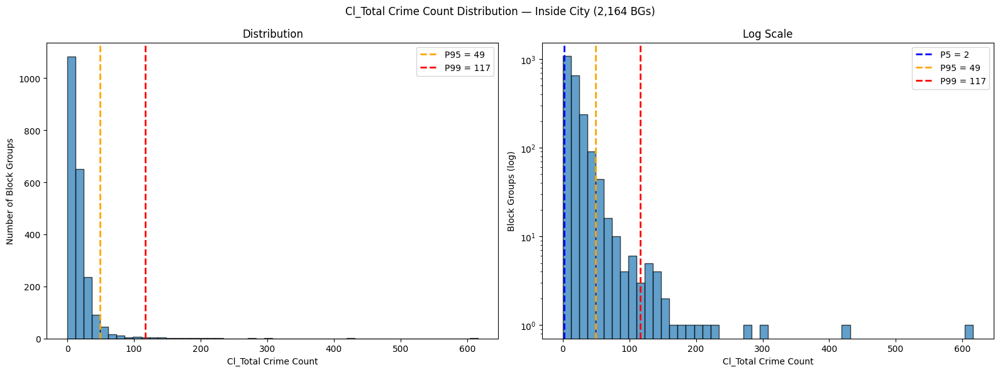

In [11]:
# Now distributions show the full picture including zero-crime BGs
plot_distribution(bg_all, crime_type='cl_total', suffix='count', block_groups='inside')

In [12]:
# Check percentage of different crime types
bg_cat_inside = bg_cat[bg_cat['within_city'] == True]
cl_total = bg_cat_inside['cl_total_count'].sum()
violent_total = bg_cat_inside['violent_count'].sum()
property_total = bg_cat_inside['property_count'].sum()

print(f"CL Total crimes inside city: {cl_total:,.0f}")
print(f"{'='*60}")

# Property vs Violent split
print(f"\n{'violent':>12}: {violent_total:>10,.0f}  ({violent_total/cl_total*100:>5.1f}% of total)")
print(f"{'property':>12}: {property_total:>10,.0f}  ({property_total/cl_total*100:>5.1f}% of total)")

# Violent breakdown
print(f"\n  Violent breakdown:")
for col in ['assault_count', 'murder_count', 'rape_count', 'robbery_count']:
    if col in bg_cat_inside.columns:
        val = bg_cat_inside[col].sum()
        print(f"    {col.replace('_count',''):>10}: {val:>10,.0f}  ({val/violent_total*100:>5.1f}% of violent)")

# Property breakdown
print(f"\n  Property breakdown:")
for col in ['burglary_count', 'larceny_count', 'mvt_count']:
    if col in bg_cat_inside.columns:
        val = bg_cat_inside[col].sum()
        print(f"    {col.replace('_count',''):>10}: {val:>10,.0f}  ({val/property_total*100:>5.1f}% of property)")

print(f"\n{'cl_total':>12}: {cl_total:>10,.0f}  (100.0%)")

CL Total crimes inside city: 39,547

     violent:      7,947  ( 20.1% of total)
    property:     31,600  ( 79.9% of total)

  Violent breakdown:
       assault:      5,071  ( 63.8% of violent)
        murder:        163  (  2.1% of violent)
          rape:        690  (  8.7% of violent)
       robbery:      2,023  ( 25.5% of violent)

  Property breakdown:
      burglary:      2,377  (  7.5% of property)
       larceny:     22,357  ( 70.8% of property)
           mvt:      6,866  ( 21.7% of property)

    cl_total:     39,547  (100.0%)


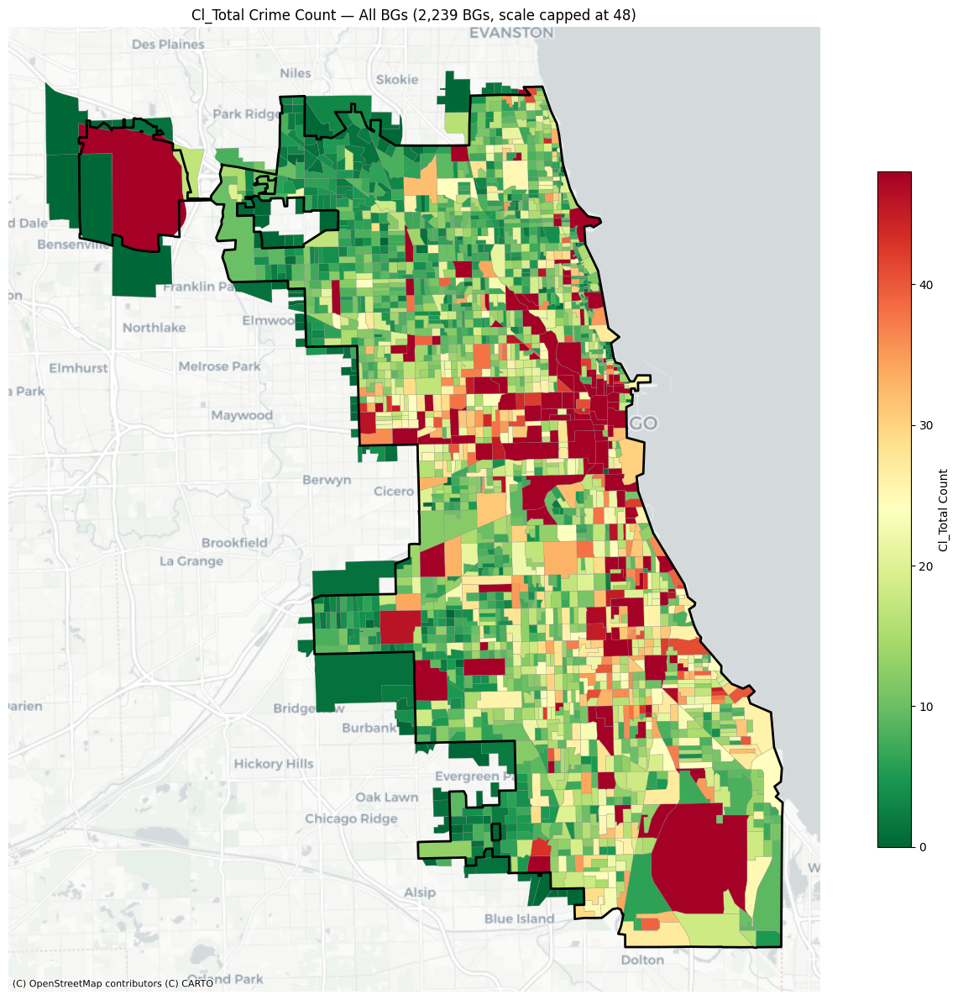

In [13]:
# Choropleth: total crime counts for all BGs
plot_bg_choropleth(bg_all, city_gdf, crime_type='cl_total', block_groups='all', 
                   cmap='RdYlGn_r', vmax=95)

##### Some cool experimentation to understand spatial patterns in crime

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse

def std_deviational_ellipse(gdf, weight_col='cl_total_count', crs_proj="EPSG:3857"):
    """
    Compute Standard Deviational Ellipse from block group centroids weighted by crime counts.
    
    Parameters
    ----------
    gdf : GeoDataFrame with polygon geometry and a weight column
    weight_col : column name for crime counts (weights)
    crs_proj : projected CRS for distance calculations (meters)
    
    Returns
    -------
    dict with keys: center_x, center_y, sigma_major, sigma_minor, angle_deg, axis_ratio
    """
    # Project to meters for meaningful distances
    proj = gdf.to_crs(crs_proj)
    centroids = proj.geometry.centroid
    
    x = centroids.x.values
    y = centroids.y.values
    w = gdf[weight_col].values.astype(float)
    
    # Exclude zero-weight BGs
    mask = w > 0
    x, y, w = x[mask], y[mask], w[mask]
    w_norm = w / w.sum()
    
    # Weighted mean center
    cx = np.average(x, weights=w_norm)
    cy = np.average(y, weights=w_norm)
    
    # Deviations
    dx = x - cx
    dy = y - cy
    
    # Weighted variance-covariance matrix
    var_x = np.average(dx**2, weights=w_norm)
    var_y = np.average(dy**2, weights=w_norm)
    cov_xy = np.average(dx * dy, weights=w_norm)
    
    cov_matrix = np.array([[var_x, cov_xy], [cov_xy, var_y]])
    eigvals, eigvecs = np.linalg.eigh(cov_matrix)
    
    # eigh returns eigenvalues in ascending order
    sigma_minor = np.sqrt(eigvals[0])
    sigma_major = np.sqrt(eigvals[1])
    
    # Angle of the major axis (from x-axis, counterclockwise)
    angle = np.degrees(np.arctan2(eigvecs[1, 1], eigvecs[0, 1]))
    
    return {
        'center_x': cx, 'center_y': cy,
        'sigma_major': sigma_major,  # meters
        'sigma_minor': sigma_minor,  # meters
        'angle_deg': angle,
        'axis_ratio': sigma_major / sigma_minor,  # >1 = elongated/directional
    }

# --- Usage in your notebook ---
inside_bgs = bg_all[bg_all['within_city'] == True].copy()
result = std_deviational_ellipse(inside_bgs, weight_col='cl_total_count')

print(f"Mean center (projected): ({result['center_x']:.0f}, {result['center_y']:.0f})")
print(f"Major axis σ: {result['sigma_major']:.0f} m")
print(f"Minor axis σ: {result['sigma_minor']:.0f} m")
print(f"Orientation:  {result['angle_deg']:.1f}°")
print(f"Axis ratio:   {result['axis_ratio']:.2f}")  # Houston ≈ 1.x (circular), Chicago ≈ 2+ (directional)

Mean center (projected): (-9758854, 5138841)
Major axis σ: 13204 m
Minor axis σ: 5299 m
Orientation:  106.8°
Axis ratio:   2.49


In [15]:
# 1. Baseline: SDE of city BGs with EQUAL weights (= pure city shape)
inside_bgs['uniform'] = 1.0
baseline = std_deviational_ellipse(inside_bgs, weight_col='uniform')

# 2. Crime-weighted SDE (what you already have)
crime_sde = std_deviational_ellipse(inside_bgs, weight_col='cl_total_count')

# 3. Compare
print(f"{'Metric':<20} {'City Shape':<15} {'Crime-Weighted':<15}")
print(f"{'Axis ratio':<20} {baseline['axis_ratio']:<15.2f} {crime_sde['axis_ratio']:<15.2f}")
print(f"{'Angle (°)':<20} {baseline['angle_deg']:<15.1f} {crime_sde['angle_deg']:<15.1f}")
print(f"{'Major σ (m)':<20} {baseline['sigma_major']:<15.0f} {crime_sde['sigma_major']:<15.0f}")
print(f"{'Minor σ (m)':<20} {baseline['sigma_minor']:<15.0f} {crime_sde['sigma_minor']:<15.0f}")

# Relative directionality: how much MORE directional is crime vs. the city shape?
relative_ratio = crime_sde['axis_ratio'] / baseline['axis_ratio']
angle_diff = crime_sde['angle_deg'] - baseline['angle_deg']
print(f"\nRelative axis ratio (crime / shape): {relative_ratio:.2f}")
print(f"Angle difference: {angle_diff:.1f}°")

Metric               City Shape      Crime-Weighted 
Axis ratio           2.53            2.49           
Angle (°)            106.3           106.8          
Major σ (m)          14570           13204          
Minor σ (m)          5759            5299           

Relative axis ratio (crime / shape): 0.98
Angle difference: 0.6°


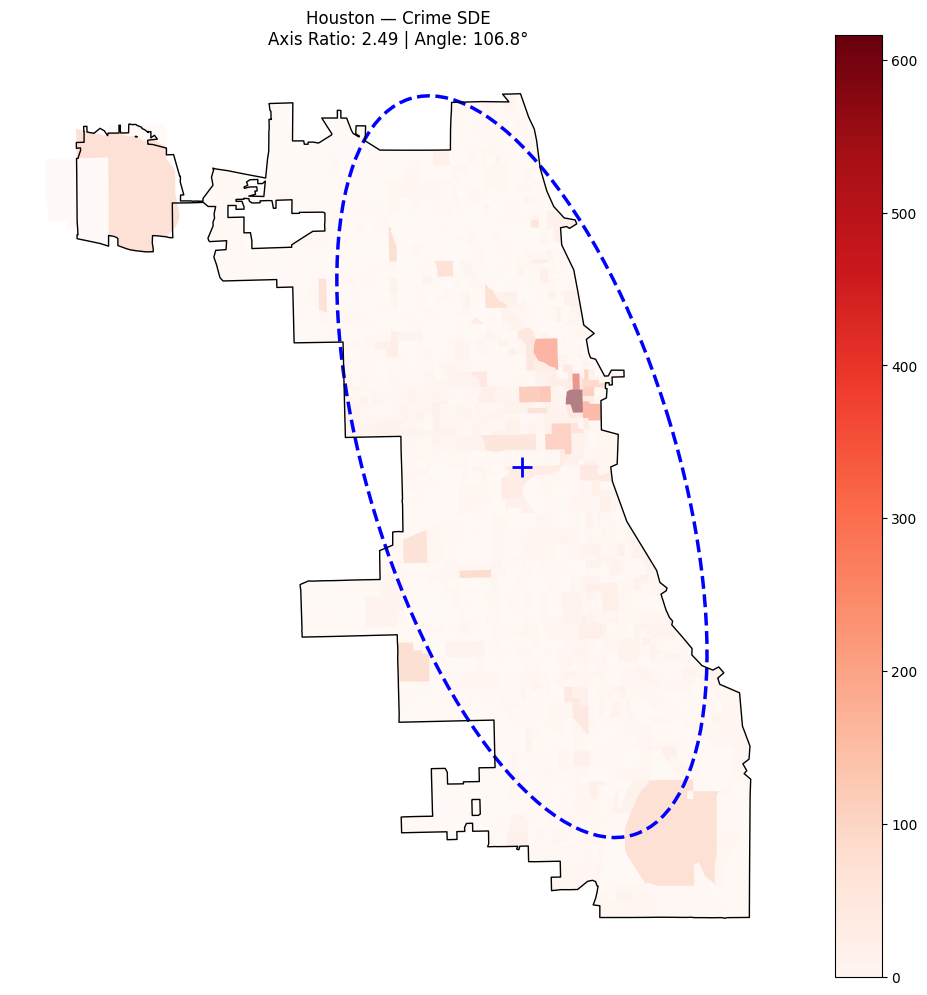

In [16]:
def plot_sde(gdf, city_gdf, weight_col='cl_total_count', title='Standard Deviational Ellipse'):
    proj_crs = "EPSG:3857"
    result = std_deviational_ellipse(gdf, weight_col, crs_proj=proj_crs)
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    gdf.to_crs(proj_crs).plot(ax=ax, column=weight_col, cmap='Reds', alpha=0.5, legend=True)
    city_gdf.to_crs(proj_crs).boundary.plot(ax=ax, color='black', linewidth=1)
    
    # Draw ellipse (2σ covers ~95% of weighted distribution)
    ellipse = Ellipse(
        (result['center_x'], result['center_y']),
        width=2 * result['sigma_major'] * 2,   # 2σ diameter
        height=2 * result['sigma_minor'] * 2,
        angle=result['angle_deg'],
        fill=False, edgecolor='blue', linewidth=2.5, linestyle='--'
    )
    ax.add_patch(ellipse)
    ax.plot(result['center_x'], result['center_y'], 'b+', markersize=15, markeredgewidth=2)
    ax.set_title(f"{title}\nAxis Ratio: {result['axis_ratio']:.2f} | Angle: {result['angle_deg']:.1f}°")
    ax.set_axis_off()
    plt.tight_layout()
    plt.show()

plot_sde(inside_bgs, city_gdf, weight_col='cl_total_count', title='Houston — Crime SDE')

/tmp/ipykernel_2210934/3186318797.py:5: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(inside_bgs)
/home/eprashar_solutions_corelogic_com/.cache/pypoetry/virtualenvs/crime-idx-2026-v3aYThD0-py3.12/lib/python3.12/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  W.__init__(self, neighbors, ids=ids, **kw)


Global Moran's I: 0.321 (p=0.0010)


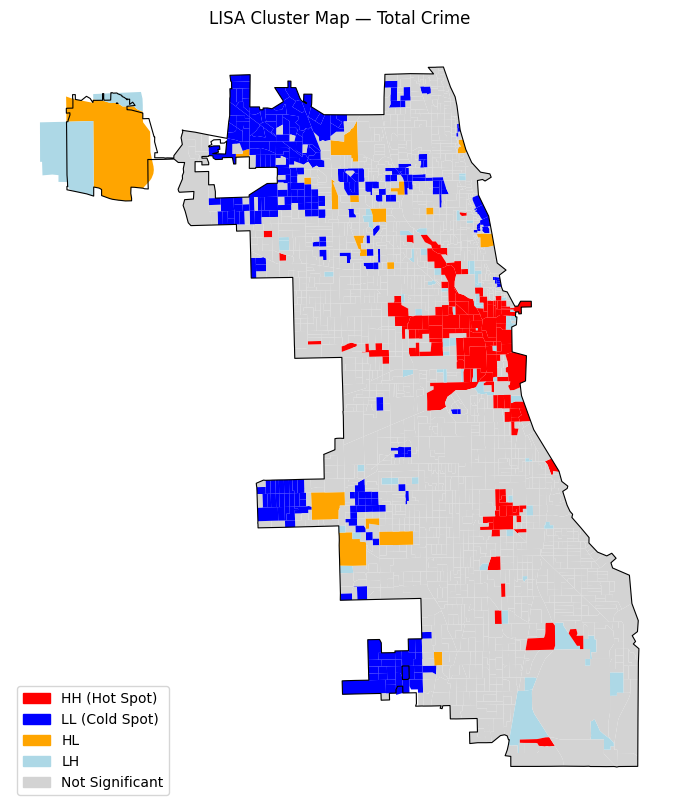

In [17]:
from esda.moran import Moran, Moran_Local
from libpysal.weights import Queen

# Spatial weights (adjacency)
w = Queen.from_dataframe(inside_bgs)
w.transform = 'r'  # row-standardize

y = inside_bgs['cl_total_count'].values

# --- Global ---
mi = Moran(y, w, permutations=999)
print(f"Global Moran's I: {mi.I:.3f} (p={mi.p_sim:.4f})")
# Higher I = more clustered. Compare this number across cities.

# --- Local (LISA) ---
lisa = Moran_Local(y, w, permutations=999)
inside_bgs['lisa_I'] = lisa.Is           # local I value
inside_bgs['lisa_q'] = lisa.q            # quadrant (1=HH, 2=LH, 3=LL, 4=HL)
inside_bgs['lisa_sig'] = lisa.p_sim < 0.05  # significant at 5%

# LISA cluster map
labels = {1: 'HH (Hot Spot)', 2: 'LH', 3: 'LL (Cold Spot)', 4: 'HL'}
inside_bgs['cluster'] = inside_bgs.apply(
    lambda r: labels[r['lisa_q']] if r['lisa_sig'] else 'Not Significant', axis=1
)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
colors = {'HH (Hot Spot)': 'red', 'LL (Cold Spot)': 'blue', 
           'HL': 'orange', 'LH': 'lightblue', 'Not Significant': 'lightgrey'}
inside_bgs.plot(ax=ax, color=inside_bgs['cluster'].map(colors), edgecolor='none')
city_gdf.boundary.plot(ax=ax, color='black', linewidth=0.8)
ax.set_title("LISA Cluster Map — Total Crime")
ax.set_axis_off()
# Add legend
from matplotlib.patches import Patch
legend_patches = [Patch(color=v, label=k) for k, v in colors.items()]
ax.legend(handles=legend_patches, loc='lower left')
plt.show()

##### Load crime risk model data (with LODES for employment)

In [18]:
# Load model data, employment numbers from lodes and merge with analysis set
crisk_df = load_model_data(bg_all)
lodes_bg = load_lodes_bg()

# Merge crime risk model data with data from the city (inner join)
comparison = merge_model_with_actuals(bg_all, crisk_df)

Model loaded: 300,363 total BGs, 2,239 matched to analysis set
LODES loaded: 2,288,249 blocks -> 237,793 block groups
Merged comparison set: 2,239 BGs
  Inside city: 2,164 | Outside: 75


In [19]:
# Normalize city crime by population and (population + daytime employment from lodes data)
comparison = normalize_actuals(comparison, lodes_bg=lodes_bg)

Normalized actuals to rate/1K: 2,236 BGs with population > 0
Daytime-adjusted rates: 2,238 BGs with daytime_pop > 0


In [20]:
# Examine comparison dataframe
# Counts come from city; pt_ct columns come from Cotality crime risk model; 
# rate refers to crime from city data normalized by population of block group
# rate_daytime refers to crime data from city normalized to (population + daytime employement from LODES)   
comparison.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2239 entries, 0 to 2238
Data columns (total 59 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   geoid                  2239 non-null   str     
 1   within_city            2239 non-null   bool    
 2   geometry               2239 non-null   geometry
 3   bg_key                 2234 non-null   str     
 4   total_count            2239 non-null   float64 
 5   assault_count          2239 non-null   float64 
 6   burglary_count         2239 non-null   float64 
 7   fire_count             2239 non-null   float64 
 8   larceny_count          2239 non-null   float64 
 9   murder_count           2239 non-null   float64 
 10  mvt_count              2239 non-null   float64 
 11  rape_count             2239 non-null   float64 
 12  robbery_count          2239 non-null   float64 
 13  vandal_count           2239 non-null   float64 
 14  violent_count          2239 non-

In [21]:
# Extract national rates and compute weighted scores
national_rates = extract_national_rates()
comparison = compute_weighted_scores(comparison, national_rates)
comparison.info()

National rates extracted: {'violent_pt_u': 3.591, 'murder_pt_u': 0.05, 'rape_pt_u': 0.375, 'robbery_pt_u': 0.606, 'assault_pt_u': 2.561, 'property_pt_u': 17.601, 'burglary_pt_u': 2.292, 'larceny_pt_u': 12.721, 'mvt_pt_u': 2.588}
Weighted scores computed: wtotal_rel median = 0.46, wprop_rel median=0.50
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2239 entries, 0 to 2238
Data columns (total 63 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   geoid                  2239 non-null   str     
 1   within_city            2239 non-null   bool    
 2   geometry               2239 non-null   geometry
 3   bg_key                 2234 non-null   str     
 4   total_count            2239 non-null   float64 
 5   assault_count          2239 non-null   float64 
 6   burglary_count         2239 non-null   float64 
 7   fire_count             2239 non-null   float64 
 8   larceny_count          2239 non-null   float64 


Total Model Score (per 1K pop) Distribution — Inside City (2,164 BGs)
count    2164.000
mean       54.653
std        35.051
min         8.243
25%        30.640
50%        42.936
75%        68.259
max       269.467
Block groups with zero: 0 / 2,164 (0.0%)
------------------------------------------------------------
  P 1:     13.412   (2,142 BGs >= this)
  P 5:     18.639   (2,055 BGs >= this)
  P10:     22.546   (1,947 BGs >= this)
  P25:     30.640   (1,623 BGs >= this)
  P50:     42.936   (1,082 BGs >= this)
  P75:     68.259   (541 BGs >= this)
  P90:    108.418   (217 BGs >= this)
  P95:    127.575   (109 BGs >= this)
  P99:    170.909   (22 BGs >= this)


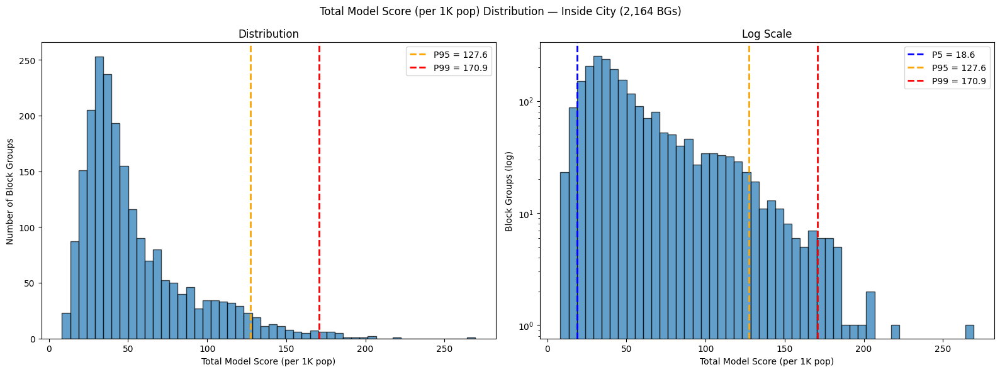

In [22]:
# Model score distributions
# Model doesn't have a cl_total: that's only for city crime data
#for scope in ['all', 'inside', 'outside']:
plot_distribution(comparison, crime_type='total', suffix='pt_ct', block_groups='inside')


Cl_Total Rate (per 1K pop) Distribution — Inside City (2,164 BGs)
count    2161.000
mean       18.332
std        92.778
min         0.000
25%         5.747
50%        10.526
75%        19.211
max      3100.000
Block groups with zero: 22 / 2,164 (1.0%)
------------------------------------------------------------
  P 1:      0.185   (2,139 BGs >= this)
  P 5:      2.395   (2,053 BGs >= this)
  P10:      3.444   (1,945 BGs >= this)
  P25:      5.747   (1,621 BGs >= this)
  P50:     10.526   (1,081 BGs >= this)
  P75:     19.211   (541 BGs >= this)
  P90:     29.579   (217 BGs >= this)
  P95:     38.141   (109 BGs >= this)
  P99:     82.987   (22 BGs >= this)


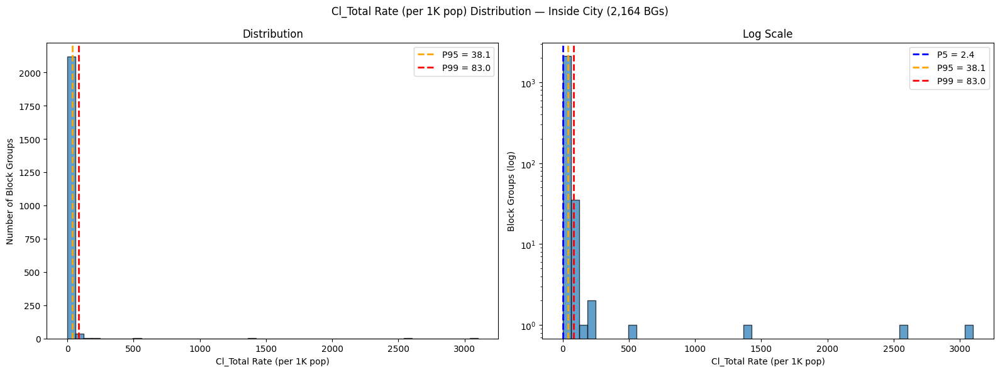


Cl_Total Rate (per 1K daytime pop) Distribution — Inside City (2,164 BGs)
count    2163.000
mean       13.290
std        67.238
min         0.000
25%         4.969
50%         8.939
75%        15.987
max      3100.000
Block groups with zero: 22 / 2,164 (1.0%)
------------------------------------------------------------
  P 1:      0.132   (2,141 BGs >= this)
  P 5:      2.076   (2,054 BGs >= this)
  P10:      2.995   (1,946 BGs >= this)
  P25:      4.969   (1,622 BGs >= this)
  P50:      8.939   (1,082 BGs >= this)
  P75:     15.987   (541 BGs >= this)
  P90:     24.499   (217 BGs >= this)
  P95:     30.919   (109 BGs >= this)
  P99:     46.418   (22 BGs >= this)


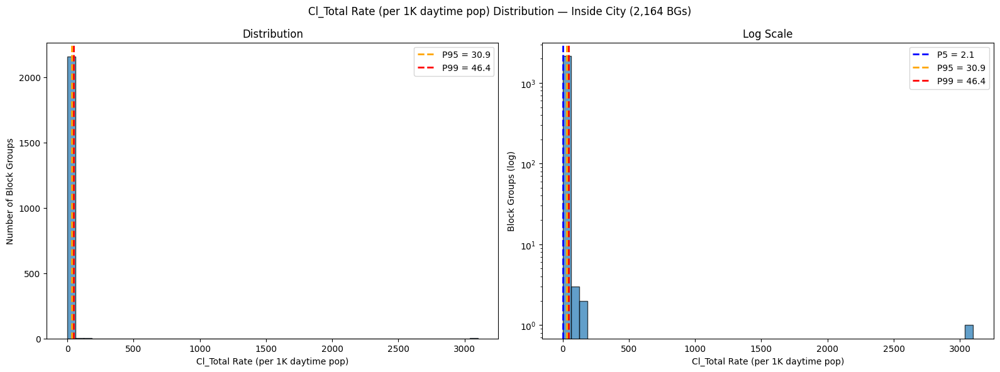

In [23]:
# Check distribution of city crime rate and city crime rate with daytime population added
plot_distribution(comparison, crime_type='cl_total', suffix='rate', block_groups='inside')
plot_distribution(comparison, crime_type='cl_total', suffix='rate_daytime', block_groups='inside')


Cl_Total Rate (per 1K pop) Distribution — Inside City (2,138 BGs)
count    2138.000
mean       13.979
std        11.734
min         0.000
25%         5.698
50%        10.373
75%        18.833
max        81.680
Block groups with zero: 22 / 2,138 (1.0%)
------------------------------------------------------------
  P 1:      0.114   (2,116 BGs >= this)
  P 5:      2.378   (2,031 BGs >= this)
  P10:      3.418   (1,924 BGs >= this)
  P25:      5.698   (1,603 BGs >= this)
  P50:     10.373   (1,069 BGs >= this)
  P75:     18.833   (535 BGs >= this)
  P90:     28.766   (214 BGs >= this)
  P95:     36.294   (107 BGs >= this)
  P99:     60.309   (22 BGs >= this)


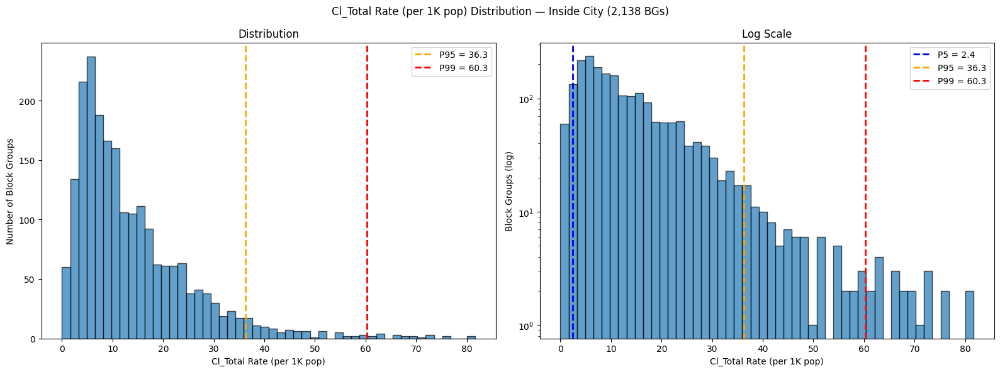


Cl_Total Rate (per 1K daytime pop) Distribution — Inside City (2,140 BGs)
count    2140.000
mean       11.319
std         8.597
min         0.000
25%         4.928
50%         8.782
75%        15.717
max        46.243
Block groups with zero: 22 / 2,140 (1.0%)
------------------------------------------------------------
  P 1:      0.083   (2,118 BGs >= this)
  P 5:      2.034   (2,033 BGs >= this)
  P10:      2.968   (1,926 BGs >= this)
  P25:      4.928   (1,605 BGs >= this)
  P50:      8.782   (1,070 BGs >= this)
  P75:     15.717   (535 BGs >= this)
  P90:     23.956   (214 BGs >= this)
  P95:     29.092   (107 BGs >= this)
  P99:     38.666   (22 BGs >= this)


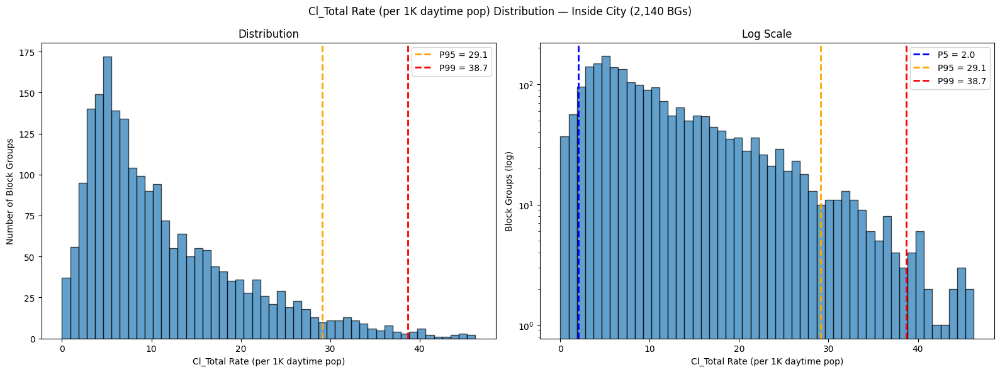

In [24]:
# Using P99 as a cutoff before plotting
p99 = comparison['cl_total_rate'].quantile(0.99)
plot_distribution(comparison[comparison['cl_total_rate'] <= p99], 
                  crime_type='cl_total', suffix='rate', block_groups='inside')

p99d = comparison['cl_total_rate_daytime'].quantile(0.99)
plot_distribution(comparison[comparison['cl_total_rate_daytime'] <= p99d], 
                  crime_type='cl_total', suffix='rate_daytime', block_groups='inside')

In [25]:
# Scanning outliers
threshold = comparison['cl_total_rate'].quantile(0.99)
city_crime_rate_outliers = comparison[comparison['cl_total_rate']>threshold][['geoid','within_city','population','c000','cl_total_count','cl_total_rate','cl_total_rate_daytime']].sort_values(by='cl_total_rate',ascending=False)
print(f"Number of outlier observations: {len(city_crime_rate_outliers)}")
print("="*80)
print(city_crime_rate_outliers)

Number of outlier observations: 23
             geoid  within_city  population      c000  cl_total_count  \
2094  170313511001         True        10.0       0.0            31.0   
1173  170319801001         True        18.0    6194.0            46.0   
114   170318381001         True        18.0   10303.0            25.0   
1520  170310609002         True        30.0      77.0            15.0   
992   170313201012         True        74.0     241.0            18.0   
1346  170318424001         True       434.0    2428.0            99.0   
1073  170318382002         True       418.0    6794.0            53.0   
1645  170318391001         True      4975.0  270976.0           616.0   
1866  170315002002         True       462.0    1241.0            54.0   
1521  170310817002         True      3700.0   23891.0           420.0   
772   170318311001         True      1167.0    2085.0           130.0   
836   170313817001         True        18.0      64.0             2.0   
1828  1703183090

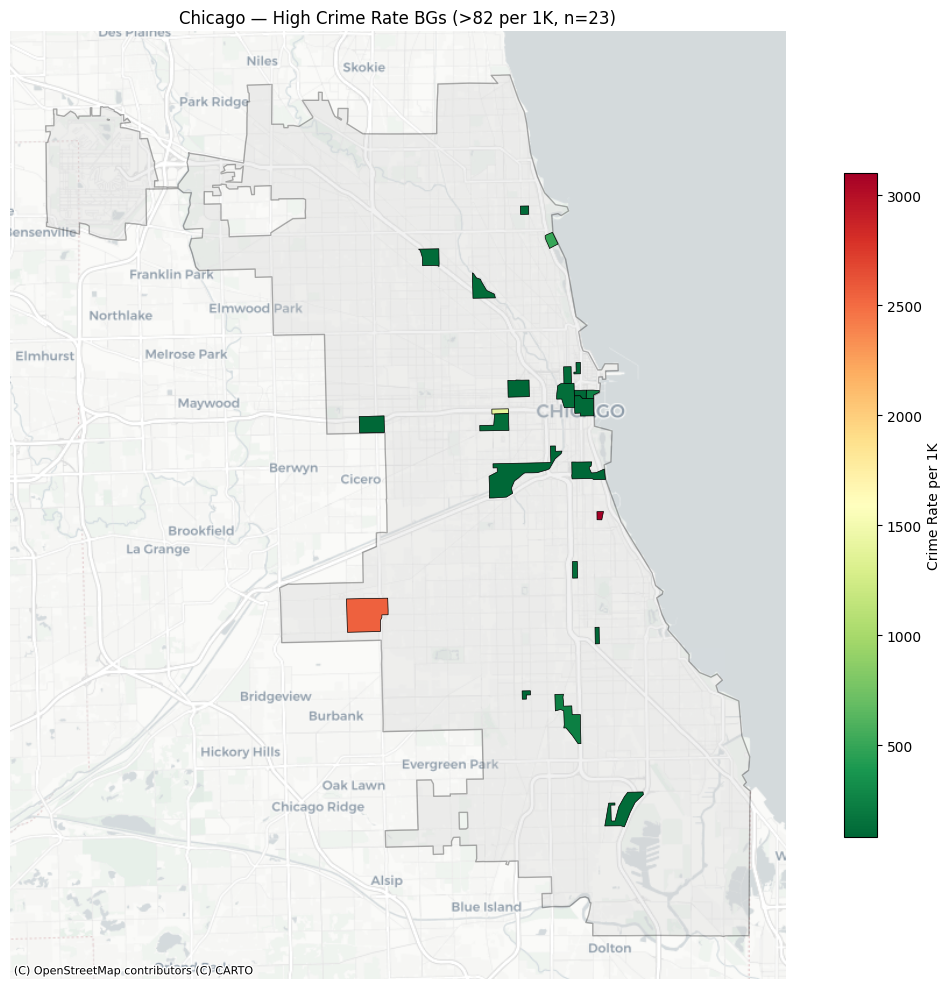

In [26]:
# Get outlier BGs as GeoDataFrame
outlier_gdf = bg_gdf[['geoid', 'geometry']].merge(city_crime_rate_outliers, on='geoid')
outlier_gdf = gpd.GeoDataFrame(outlier_gdf, geometry='geometry', crs='EPSG:4326')

# Plot on city map
fig, ax = plt.subplots(figsize=(12, 10))
city_3857 = city_gdf.to_crs(epsg=3857)
city_3857.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=1, alpha=0.3)
outlier_gdf.to_crs(epsg=3857).plot(ax=ax, column='cl_total_rate', cmap='RdYlGn_r', 
                                    edgecolor='black', linewidth=0.5, legend=True,
                                    legend_kwds={'shrink': 0.7, 'label': 'Crime Rate per 1K'})
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)
ax.set_title(f'{cfg.name} — High Crime Rate BGs (>{threshold:.0f} per 1K, n={len(outlier_gdf)})')
ax.set_axis_off()
plt.tight_layout()
plt.show()

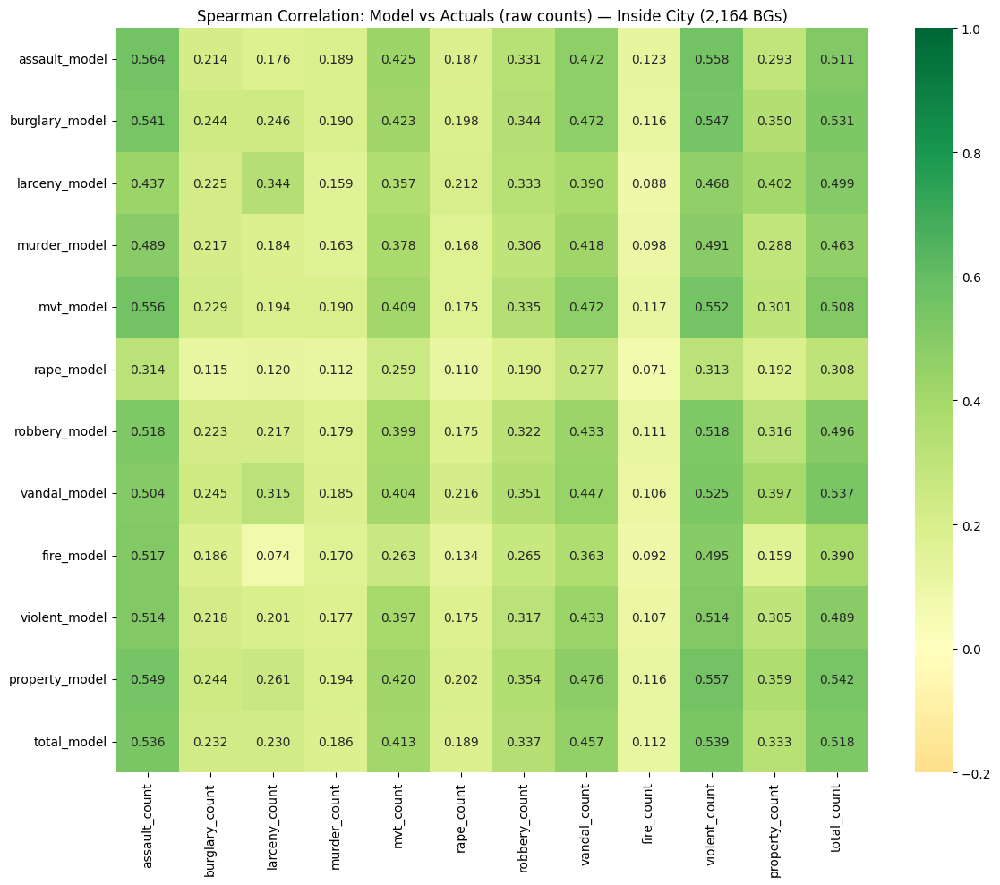


Same-category Spearman correlations — count (Inside City):
     assault: 0.564
    burglary: 0.244
     larceny: 0.344
      murder: 0.163
         mvt: 0.409
        rape: 0.110
     robbery: 0.322
      vandal: 0.447
        fire: 0.092
     violent: 0.514
    property: 0.359
       total: 0.518


In [27]:
# Spearman correlation heatmaps: model vs actual crime counts
#for scope in ['all', 'inside', 'outside']:
plot_correlation_heatmap(comparison, block_groups='inside', actual_suffix='count')

In [28]:
# Check correlation with cl_total_counts
print(f"Correlation between model totals and city totals:")
print("="*80)
print(f"{comparison[['total_pt_ct','cl_total_count']].corr(method='spearman')}")
threshold = comparison['cl_total_count'].quantile(0.9)
comparison_without_outliers = comparison[comparison['cl_total_count'] < threshold]
corr = comparison_without_outliers[['total_pt_ct','cl_total_count']].corr(method='spearman')
print(f"Correlation once outliers are removed: ")
print("="*80)
print(corr)

Correlation between model totals and city totals:
                total_pt_ct  cl_total_count
total_pt_ct        1.000000        0.455023
cl_total_count     0.455023        1.000000
Correlation once outliers are removed: 
                total_pt_ct  cl_total_count
total_pt_ct        1.000000        0.462004
cl_total_count     0.462004        1.000000


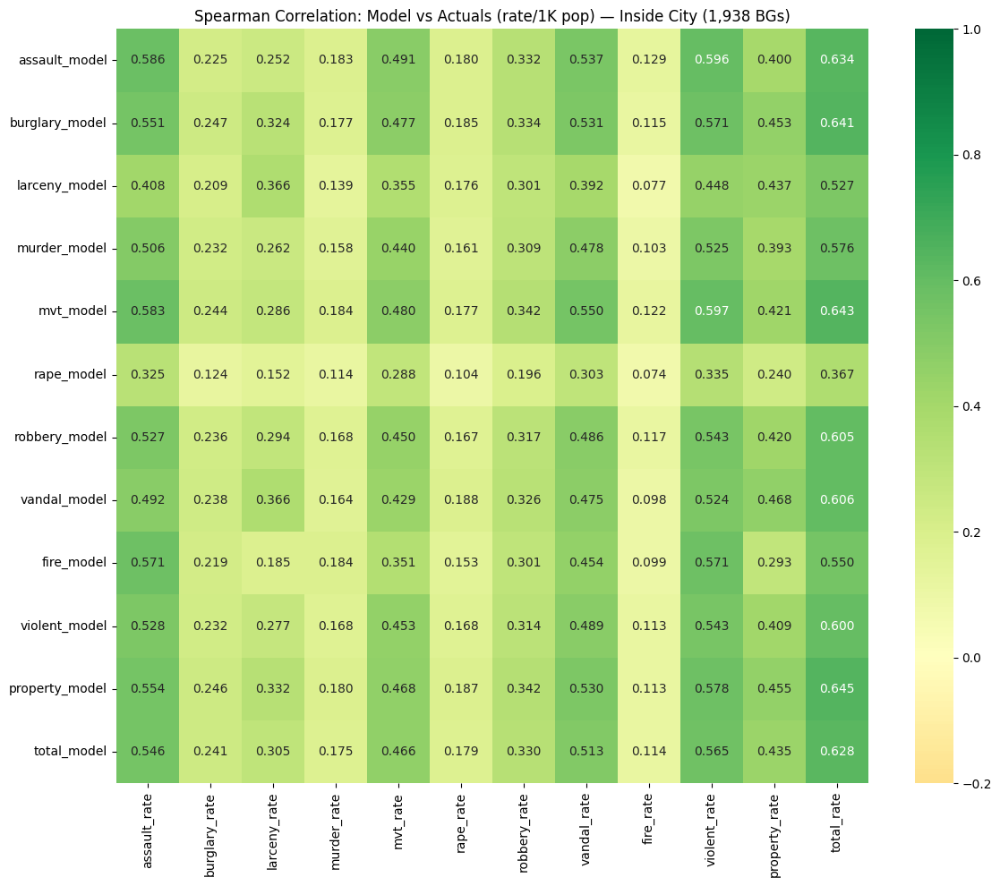


Same-category Spearman correlations — rate (Inside City):
     assault: 0.586
    burglary: 0.247
     larceny: 0.366
      murder: 0.158
         mvt: 0.480
        rape: 0.104
     robbery: 0.317
      vandal: 0.475
        fire: 0.099
     violent: 0.543
    property: 0.455
       total: 0.628


In [29]:
# Spearman correlation heatmaps: model vs NORMALIZED actuals (rate per 1K)
# Remove outliers
threshold = comparison['cl_total_rate'].quantile(0.9)
comparison_minus_outliers = comparison[comparison['cl_total_rate'] <threshold]
#for scope in ['all', 'inside', 'outside']:
plot_correlation_heatmap(comparison_minus_outliers, block_groups='inside', actual_suffix='rate')

In [30]:
# Find correlation between totals from the model and cl_total from city crime data
corr = comparison_minus_outliers[['total_pt_ct', 'cl_total_rate']].corr(method='spearman')
print(corr)

               total_pt_ct  cl_total_rate
total_pt_ct         1.0000         0.5555
cl_total_rate       0.5555         1.0000


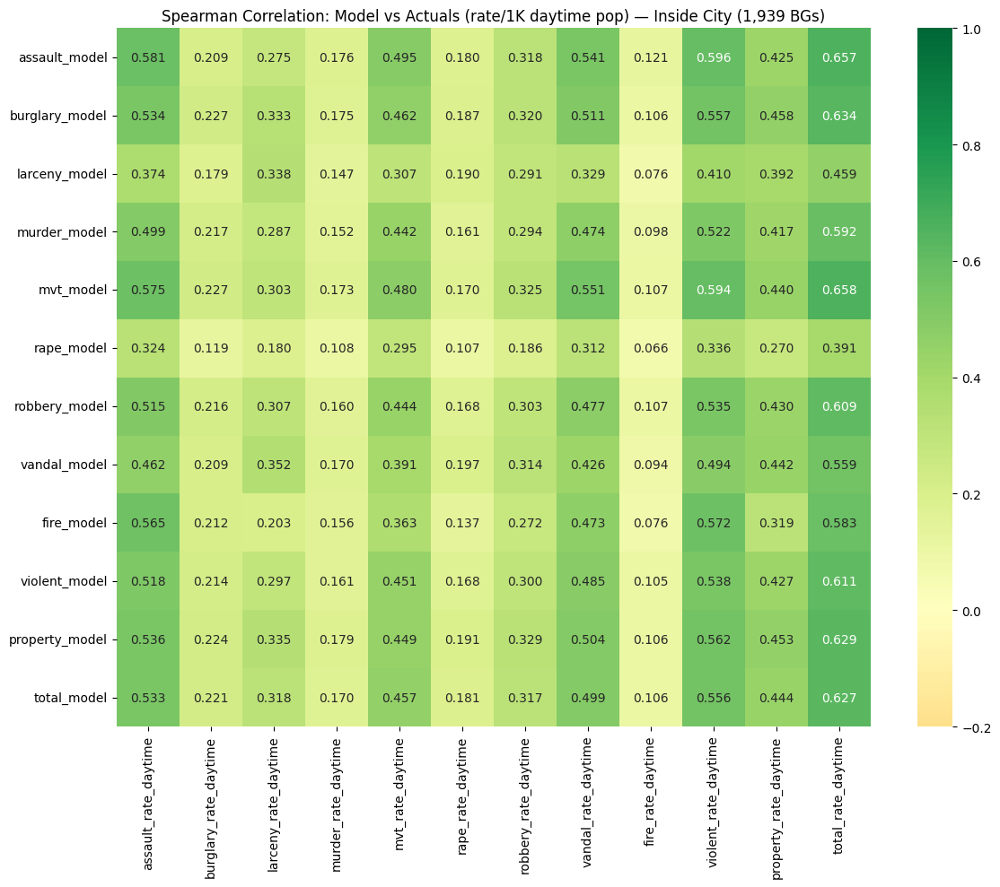


Same-category Spearman correlations — rate_daytime (Inside City):
     assault: 0.581
    burglary: 0.227
     larceny: 0.338
      murder: 0.152
         mvt: 0.480
        rape: 0.107
     robbery: 0.303
      vandal: 0.426
        fire: 0.076
     violent: 0.538
    property: 0.453
       total: 0.627


In [31]:
# Correlation plots with addition of daytime population
# Remove outliers
threshold = comparison['cl_total_rate_daytime'].quantile(0.9)
comparison_minus_outliers = comparison[comparison['cl_total_rate_daytime'] <threshold]
#for scope in ['all','inside','outside']:
plot_correlation_heatmap(comparison_minus_outliers, block_groups='inside', actual_suffix='rate_daytime')

In [32]:
# Find correlation between totals from the model and cl_total from city crime data
corr = comparison_minus_outliers[['total_pt_ct', 'cl_total_rate_daytime']].corr(method='spearman')
print(corr)

                       total_pt_ct  cl_total_rate_daytime
total_pt_ct               1.000000               0.562615
cl_total_rate_daytime     0.562615               1.000000


In [33]:
# Correlation between totals from model and weighted value of crime
threshold = comparison['cl_total_rate'].quantile(0.9)
comparison_minus_outliers = comparison[comparison['cl_total_rate'] <threshold]
corr = comparison_minus_outliers[['total_pt_ct', 'wtotal_rate']].corr(method='spearman')
print(corr)

             total_pt_ct  wtotal_rate
total_pt_ct     1.000000     0.572942
wtotal_rate     0.572942     1.000000


##### Lorenz Curves

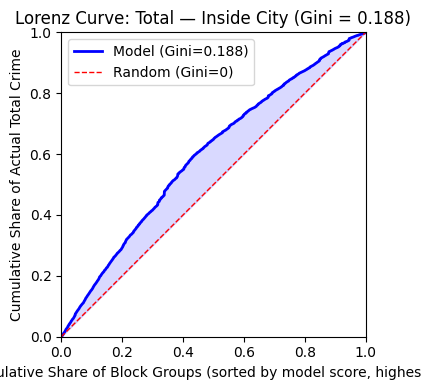


Gini coefficient: 0.188

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             8.1%              1.6x
     10%            15.4%              1.5x
     20%            29.2%              1.5x
     30%            41.6%              1.4x
     50%            64.9%              1.3x
  To capture 50% of total: need top 35.6% of BGs
  To capture 80% of total: need top 69.3% of BGs


np.float64(0.19)

In [34]:
# Lorenz curves + Gini for key categories
categories = ['total','assault','murder', 'violent', 'property',  'burglary', 'larceny', 'robbery']
#for cat in categories:
    #for scope in ['all', 'inside', 'outside']:
plot_lorenz_curve(comparison, crime_type='total', block_groups='inside')

##### Eval data for Lorenz Curves

In [44]:
# Load and prep eval data
evals = load_evals()
evals = extract_bg_geoid(evals)
validate_block_cols(evals)

# Get list of carriers
carriers = evals['carrier'].unique().tolist()
print(f"Available carriers: {carriers}")

Evals loaded: 3,408,855 rows, 4 carriers
Carriers: {'TRAV': 2480028, 'Guard': 638020, 'HANO': 190239, 'OregonMutal': 100568}
Extracted bg_geoid from crime_censusblock. Sample: ['060530140001', '530250111022', '530250111022']
Block column match rate: 100.0%
Available carriers: ['OregonMutal', 'Guard', 'TRAV', 'HANO']


In [45]:
# Check which carriers have data post 2020
evals[evals['year']>=2021]['carrier'].value_counts()

carrier
Guard          242071
OregonMutal     62016
Name: count, dtype: int64[pyarrow]

In [46]:
# Filter to Guard, 2021-2022
evals = evals[(evals['carrier'] == 'Guard') & (evals['year'].isin([2021, 2022]))]
print(f"Guard evals 2021-2022: {len(evals):,} rows")
print(evals['year'].value_counts())

Guard evals 2021-2022: 241,450 rows
year
2021.0    129601
2022.0    111849
Name: count, dtype: int64


In [47]:
# Load 2021 crime data
crime_2021 = load_crime_data(cfg, csv_path="public/chicago/Crimes_Chicago_2021.csv")
crime_bg_2021 = sjoin_crimes_to_bgs(crime_2021, bg_gdf)
crime_bg_2021 = map_crime_categories(crime_bg_2021, cfg)
bg_cat_2021 = aggregate_by_bg_category(crime_bg_2021)
bg_all_2021 = merge_all_bgs_with_crimes(bg_gdf, bg_cat_2021)

comparison_2021 = merge_model_with_actuals(bg_all_2021, crisk_df)
comparison_2021 = normalize_actuals(comparison_2021, lodes_bg=lodes_bg)
comparison_2021 = compute_weighted_scores(comparison_2021, national_rates)

Chicago crime data: 202,869 rows with valid coords (of 209,715)
Matched to BG: 202,829 | Unmatched: 40
Mapped: 107,558 / 202,869 (53.0%)
Category counts:
crime_category
larceny     39256
vandal      24849
assault     15544
mvt         10480
robbery      7899
burglary     6605
rape         1583
murder        813
fire          529

Unmapped: 95,311 records across 15 codes
BG-level category aggregation: 2,255 BGs (2,163 within city, 92 outside)
Crime Totals:
assault_count     15539.0
murder_count        813.0
rape_count         1582.0
robbery_count      7899.0
burglary_count     6603.0
larceny_count     39246.0
mvt_count         10478.0
vandal_count      24842.0
violent_count     25833.0
property_count    56327.0
cl_total_count    82160.0
dtype: float64
Analysis set: 2,256 BGs
  Inside city:  2,164 (2,163 with data, 1 without)
  Outside city: 92 (all with crime data)
Merged comparison set: 2,231 BGs
  Inside city: 2,164 | Outside: 67
Normalized actuals to rate/1K: 2,228 BGs with populatio

In [48]:
# Load 2022 crime data
crime_2022 = load_crime_data(cfg, csv_path="public/chicago/Crimes_Chicago_2022.csv")
crime_bg_2022 = sjoin_crimes_to_bgs(crime_2022, bg_gdf)
crime_bg_2022 = map_crime_categories(crime_bg_2022, cfg)
bg_cat_2022 = aggregate_by_bg_category(crime_bg_2022)
bg_all_2022 = merge_all_bgs_with_crimes(bg_gdf, bg_cat_2022)

comparison_2022 = merge_model_with_actuals(bg_all_2022, crisk_df)
comparison_2022 = normalize_actuals(comparison_2022, lodes_bg=lodes_bg)
comparison_2022 = compute_weighted_scores(comparison_2022, national_rates)

Chicago crime data: 234,883 rows with valid coords (of 240,106)
Matched to BG: 234,820 | Unmatched: 63
Mapped: 136,144 / 234,883 (58.0%)
Category counts:
crime_category
larceny     53622
vandal      27026
mvt         21388
assault     14743
robbery      8955
burglary     7566
rape         1686
murder        737
fire          421

Unmapped: 98,739 records across 15 codes
BG-level category aggregation: 2,253 BGs (2,163 within city, 90 outside)
Crime Totals:
assault_count      14742.0
murder_count         736.0
rape_count          1684.0
robbery_count       8953.0
burglary_count      7563.0
larceny_count      53594.0
mvt_count          21383.0
vandal_count       27022.0
violent_count      26115.0
property_count     82540.0
cl_total_count    108655.0
dtype: float64
Analysis set: 2,254 BGs
  Inside city:  2,164 (2,163 with data, 1 without)
  Outside city: 90 (all with crime data)
Merged comparison set: 2,233 BGs
  Inside city: 2,164 | Outside: 69
Normalized actuals to rate/1K: 2,230 BGs wit

In [49]:
# Aggregate evals by year and merge with year-matched crime data
eval_2021 = aggregate_evals_to_bg(evals[evals['year'] == 2021], carrier='Guard')
eval_2022 = aggregate_evals_to_bg(evals[evals['year'] == 2022], carrier='Guard')

eval_crime_2021 = merge_evals_with_crime(eval_2021, comparison_2021)
eval_crime_2022 = merge_evals_with_crime(eval_2022, comparison_2022)

Carrier 'Guard': 129,302 rows → 56,396 block groups
  Total exposure: 117,739
  Total claims: 1,084
  Total losses: 9,899,852
Carrier 'Guard': 111,677 rows → 51,253 block groups
  Total exposure: 102,063
  Total claims: 793
  Total losses: 7,055,590
Merged: 933 of 56,396 eval BGs matched to city crime data (1.7%)
Merged: 732 of 51,253 eval BGs matched to city crime data (1.4%)


In [50]:
# Shape of the comparison dataframe
print(f"Total Block groups in our analysis set in {city}: {bg_all.shape[0]} groups")
print(f"Out of total, inside city bgs: {bg_all[bg_all['within_city']==True].shape[0]} groups")
print(f"Out of total, matched with carrier data from 2021: {eval_crime_2021.shape[0]} groups")
print(f"Out of matched, inside city bgs in 2021: {eval_crime_2021[eval_crime_2021['within_city']==True].shape[0]} groups")
print(f"Out of total, matched with carrier data from 2022: {eval_crime_2022.shape[0]} groups")
print(f"Out of matched, inside city bgs in 2022: {eval_crime_2022[eval_crime_2022['within_city']==True].shape[0]} groups")

Total Block groups in our analysis set in chicago: 2239 groups
Out of total, inside city bgs: 2164 groups
Out of total, matched with carrier data from 2021: 933 groups
Out of matched, inside city bgs in 2021: 894 groups
Out of total, matched with carrier data from 2022: 732 groups
Out of matched, inside city bgs in 2022: 694 groups


##### Common terms used in carrier evalauations:
1. Earned Exposure: Corresponds to one policy in one year. Decimal values represent partial coverage. Rare negative values are an artifact of the carrier's accounting should be excluded from analaysis
2. Premium: The policy premium paid by the insured for the corresponding earned exposure (When earned expsore = 1 premium is the annual premium)
3. Claims: The count of claims paid by the insurance carrier for given loss perils (e.g. theft claims represent all claims where the cause of loss is theft)
4. Losses: The $ amount paid out by the carrier for given loss perils (e.g. theft loss is the amount paid by the carrier where cause of loss is theft)
5. Crime Loss Types:
Theft and Vandalism are the common loss types associated with property insurance
Losses associated with violent crime can take the form of liability losses (e.g. a property owner is sued after a violent crime on their property). We recieve these loses more rarely in carrier evals but they can be very high $ amounts (not included in the evals below).

In [51]:
# Df for lorenz curves and correlations
print(f"Crime claims in 2021: {eval_crime_2021['crime_claims'].sum().round(2)}")
print(f"Exposures in 2021: {eval_crime_2021['earned_exposures'].sum().round(2)}")

# Print for 2022
print(f"Crime claims in 2022: {eval_crime_2022['crime_claims'].sum().round(2)}")
print(f"Exposures in 2022: {eval_crime_2022['earned_exposures'].sum().round(2)}")


Crime claims in 2021: 24.0
Exposures in 2021: 1512.21
Crime claims in 2022: 14.0
Exposures in 2022: 1091.67


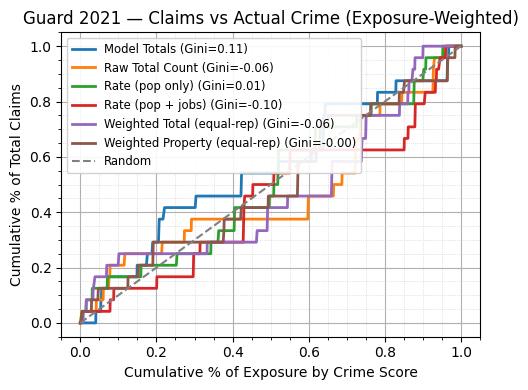

{'total_pt_ct': np.float64(0.11),
 'cl_total_count': np.float64(-0.06),
 'cl_total_rate': np.float64(0.01),
 'cl_total_rate_daytime': np.float64(-0.1),
 'wtotal_rate': np.float64(-0.06),
 'wprop_rate': np.float64(-0.0)}

In [52]:
# Lorenz curves - 2021
risk_scores = {
    'total_pt_ct': 'Model Totals',
    'cl_total_count': 'Raw Total Count',
    'cl_total_rate': 'Rate (pop only)',
    'cl_total_rate_daytime': 'Rate (pop + jobs)',
    'wtotal_rate': 'Weighted Total (equal-rep)',
    'wprop_rate': 'Weighted Property (equal-rep)',
}

plot_carrier_lorenz_multi(
    eval_crime_2021, 
    risk_score_cols=list(risk_scores.keys()),
    outcome_col='total_claims',
    x_axis='exposure_weighted',
    labels=risk_scores,
    title=f'Guard 2021 — Claims vs Actual Crime (Exposure-Weighted)'
)

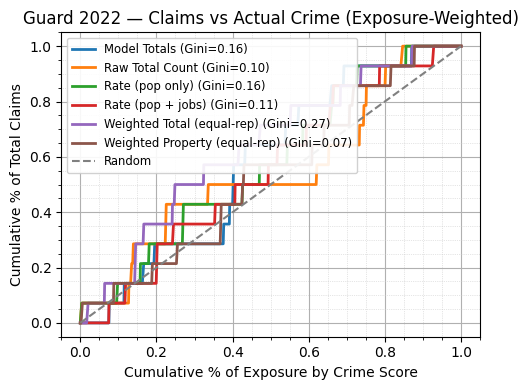

{'total_pt_ct': np.float64(0.16),
 'cl_total_count': np.float64(0.1),
 'cl_total_rate': np.float64(0.16),
 'cl_total_rate_daytime': np.float64(0.11),
 'wtotal_rate': np.float64(0.27),
 'wprop_rate': np.float64(0.07)}

In [53]:
# Lorenz curves - 2022
plot_carrier_lorenz_multi(
    eval_crime_2022, 
    risk_score_cols=list(risk_scores.keys()),
    outcome_col='total_claims',
    x_axis='exposure_weighted',
    labels=risk_scores,
    title=f'Guard 2022 — Claims vs Actual Crime (Exposure-Weighted)'
)

In [41]:
# Correlation: Spearman between city crime counts and carrier claims/losses
from scipy.stats import spearmanr

crime_cols = [
    'cl_total_count', 
    'property_count', 
    'violent_count',
    'cl_total_rate', 
    'property_rate', 
    'violent_rate',
    'cl_total_rate_daytime', 
    'property_rate_daytime', 
    'violent_rate_daytime',
    'wtotal_rate',
    'wprop_rate'
    ]
outcome_cols = ['total_claims','total_losses']

corr_data = []
for crime_col in crime_cols:
    for out_col in outcome_cols:
        valid = eval_crime[[crime_col, out_col]].dropna()
        if len(valid) > 10:
            rho, pval = spearmanr(valid[crime_col], valid[out_col])
            corr_data.append({'crime': crime_col, 'outcome': out_col, 'spearman_rho': rho, 'p_value': pval})

corr_df = pd.DataFrame(corr_data)
print(corr_df.pivot(index='crime', columns='outcome', values='spearman_rho').round(3))

outcome                total_claims  total_losses
crime                                            
cl_total_count                0.129         0.132
cl_total_rate                 0.150         0.152
cl_total_rate_daytime         0.130         0.133
property_count                0.104         0.106
property_rate                 0.128         0.130
property_rate_daytime         0.107         0.110
violent_count                 0.167         0.170
violent_rate                  0.171         0.173
violent_rate_daytime          0.153         0.155
wprop_rate                    0.130         0.132
wtotal_rate                   0.168         0.170


#### Fun Experiment

In [42]:
# 1. Get cluster labels from inside_bgs onto eval_crime
cluster_labels = inside_bgs[['geoid', 'cluster']].copy()
eval_crime_clustered = eval_crime.merge(cluster_labels, on='geoid', how='left')

print(eval_crime_clustered['cluster'].value_counts())

# 2. Compute Lorenz Gini within each cluster
def compute_lorenz_gini(df, sort_col, outcome_col):
    """Gini from Lorenz curve: sort by sort_col, cumulate outcome_col."""
    valid = df[[sort_col, outcome_col]].dropna()
    valid = valid[valid[outcome_col] > 0]  # need some outcome to measure
    if len(valid) < 10:
        return np.nan
    valid = valid.sort_values(sort_col)
    cumulative = valid[outcome_col].cumsum() / valid[outcome_col].sum()
    n = len(cumulative)
    lorenz_area = cumulative.sum() / n
    return 2 * (lorenz_area - 0.5)

# 3. Full dataset Gini (what you already have)
gini_all = compute_lorenz_gini(eval_crime_clustered, 'total_count', 'total_losses')

# 4. Within-cluster Ginis
for cluster_name in ['HH (Hot Spot)', 'LL (Cold Spot)', 'Not Significant']:
    subset = eval_crime_clustered[eval_crime_clustered['cluster'] == cluster_name]
    g = compute_lorenz_gini(subset, 'total_count', 'total_losses')
    print(f"{cluster_name:<20} n={len(subset):>4}  Gini={g:.3f}")

print(f"\n{'ALL BGs':<20} n={len(eval_crime_clustered):>4}  Gini={gini_all:.3f}")

cluster
Not Significant    1024
LL (Cold Spot)      134
HH (Hot Spot)        86
LH                   48
HL                   13
Name: count, dtype: int64
HH (Hot Spot)        n=  86  Gini=0.301
LL (Cold Spot)       n= 134  Gini=0.119
Not Significant      n=1024  Gini=-0.195

ALL BGs              n=1351  Gini=-0.203
